# Capstone - Supervised Learning

Silei Huo

## Table of content

* [1. EDA & Model Prep](#chapter1)
    * [Set Target Variable](#section_1_1)
    * [Model Prep](#section_1_2)
        
* [2. Logistic Regression - Description Data](#chapter2)
    * [Logistic Regression - TFIDF](#section_2_1)

* [3. Logistic Regression - Adding Author & Publisher](#chapter3)
    * [Logistic Regression](#section_3_1)
    * [Bagging](#section_3_2)

* [4. Random Forest](#chapter4)
    * [Section 3.1](#section_3_1)
    * [Section 3.2](#section_3_2)


In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import time
import re
import string
import joblib

In [143]:
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import plot_confusion_matrix, confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import plot_roc_curve

# EDA & Model Prep<a class="anchor" id="chapter1"></a>

In [4]:
df_book = pd.read_csv('data/children_book_processed_wauthor.csv')

In [5]:
df_book.head()

,work_id,book_id,title,description,authors,publisher,average_rating,ratings_count,url,image_url,description_clean,language_title,lem_word,author_name,author_average_rating,author_ratings_count
0,41318706,22007198,"""A"" IS FOR THE ALCHEMIST",Sisters and brothers. Cats and dogs. Science a...,"[{'author_id': '8180666', 'role': ''}]",James Larson,4.33,12,https://www.goodreads.com/book/show/22007198-a...,https://images.gr-assets.com/books/1398343990m...,Sisters and brothers Cats and dogs Science and...,en,"['sister', 'brother', 'cat', 'dog', 'science',...",James Larson,4.33,12
1,4649,334,"""A"" Is for Zebra",Mark Shulman and Tamara Petrosino return with ...,"[{'author_id': '194', 'role': ''}, {'author_id...",Sterling,3.68,46,https://www.goodreads.com/book/show/334._A_Is_...,https://images.gr-assets.com/books/1328858765m...,Mark Shulman and Tamara Petrosino return with ...,en,"['mark', 'shulman', 'tamara', 'petrosino', 're...",Mark Shulman,4.01,6540
2,45393292,25589071,"""A"" Things (A to Z Things #1)","""A"" Things is a learning book of colorful illu...","[{'author_id': '243489', 'role': ''}]",R. Barri Flowers,3.00,4,https://www.goodreads.com/book/show/25589071-a...,https://images.gr-assets.com/books/1432408553m...,A Things is a learning book of colorful illust...,en,"['thing', 'learning', 'book', 'colorful', 'ill...",R. Barri Flowers,3.37,1289
3,1715137,2586488,"""A"" is for Salad","A is for what? A is for salad, and B is for Vi...","[{'author_id': '85318', 'role': ''}]",Puffin Books,4.04,11,https://www.goodreads.com/book/show/2586488-a-...,https://images.gr-assets.com/books/1309213394m...,A is for what A is for salad and B is for Viki...,en,"['salad', 'b', 'viking', 'welcome', 'wacky', '...",Mike Lester,3.98,1861
4,42085059,22600056,"""Am I a Chameleon?""","""Am I a Chameleon?"" is the first book in the K...","[{'author_id': '267056', 'role': ''}]",Green Cup Publishing,4.57,7,https://www.goodreads.com/book/show/22600056-a...,https://images.gr-assets.com/books/1404086687m...,Am I a Chameleon is the first book in the Kati...,en,"['chameleon', 'first', 'book', 'katiejane', 's...",Kathryn Harper,4.16,31


In [6]:
df_book.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39965 entries, 0 to 39964
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   work_id                39965 non-null  int64  
 1   book_id                39965 non-null  int64  
 2   title                  39965 non-null  object 
 3   description            39965 non-null  object 
 4   authors                39965 non-null  object 
 5   publisher              37361 non-null  object 
 6   average_rating         39965 non-null  float64
 7   ratings_count          39965 non-null  int64  
 8   url                    39965 non-null  object 
 9   image_url              39965 non-null  object 
 10  description_clean      39965 non-null  object 
 11  language_title         39965 non-null  object 
 12  lem_word               39965 non-null  object 
 13  author_name            39965 non-null  object 
 14  author_average_rating  39965 non-null  float64
 15  au

### Further check the publisher and author columns

**Publisher**

In [7]:
# check NaN values

df_book['publisher'].isna().sum()

2604

Since `publisher` column will conduct One-Hot-Encoding, so will just leave the NaN values here.

In [10]:
df_book['publisher'].value_counts().head(30)

Candlewick Press                               934
Random House Books for Young Readers           925
HarperCollins                                  884
HMH Books for Young Readers                    860
Scholastic Paperbacks                          724
Scholastic                                     597
Scholastic Inc.                                550
Henry Holt and Co. (BYR)                       495
Little, Brown Books for Young Readers          431
Farrar, Straus and Giroux (BYR)                372
Puffin Books                                   359
Scholastic Press                               345
Harry N. Abrams                                329
Knopf Books for Young Readers                  313
Charlesbridge                                  302
Kids Can Press                                 294
Disney-Hyperion                                292
Cartwheel Books                                289
Puffin                                         287
Dial Books                     

In [14]:
# Group the the publisher contains 'Scholastic' into one.
df_book['publisher'].str.contains('Scholastic').sum()

2697

In [22]:
df_book = df_book.replace({'publisher': r'^.*Scholastic.*$'}, {'publisher': 'Scholastic'}, regex=True)

In [23]:
# sanity check

df_book['publisher'].value_counts().head(30)

Scholastic                                     2697
Candlewick Press                                934
Random House Books for Young Readers            925
HarperCollins                                   884
HMH Books for Young Readers                     860
Henry Holt and Co. (BYR)                        495
Little, Brown Books for Young Readers           431
Farrar, Straus and Giroux (BYR)                 372
Puffin Books                                    359
Harry N. Abrams                                 329
Knopf Books for Young Readers                   313
Charlesbridge                                   302
Kids Can Press                                  294
Disney-Hyperion                                 292
Cartwheel Books                                 289
Puffin                                          287
Dial Books                                      280
Aladdin                                         278
Holiday House                                   278
Grosset & Du

In [24]:
top_publisher = list(df_book['publisher'].value_counts().head(30).index)

In [25]:
top_publisher

['Scholastic',
 'Candlewick Press',
 'Random House Books for Young Readers',
 'HarperCollins',
 'HMH Books for Young Readers',
 'Henry Holt and Co. (BYR)',
 'Little, Brown Books for Young Readers',
 'Farrar, Straus and Giroux (BYR)',
 'Puffin Books',
 'Harry N. Abrams',
 'Knopf Books for Young Readers',
 'Charlesbridge',
 'Kids Can Press',
 'Disney-Hyperion',
 'Cartwheel Books',
 'Puffin',
 'Dial Books',
 'Aladdin',
 'Holiday House',
 'Grosset & Dunlap',
 'Roaring Brook Press',
 'Chronicle Books',
 'Bloomsbury USA Childrens',
 'Yearling',
 'Two Lions',
 'Simon Spotlight',
 'Createspace Independent Publishing Platform',
 'Disney Press',
 'Golden Books',
 "National Geographic Children's Books"]

In [26]:
# Replace non-popular publisher to 'other_publisher'

df_book.loc[~df_book.publisher.isin(top_publisher), 'publisher'] = 'other_publisher'

In [27]:
df_book['publisher'].value_counts()

other_publisher                                26547
Scholastic                                      2697
Candlewick Press                                 934
Random House Books for Young Readers             925
HarperCollins                                    884
HMH Books for Young Readers                      860
Henry Holt and Co. (BYR)                         495
Little, Brown Books for Young Readers            431
Farrar, Straus and Giroux (BYR)                  372
Puffin Books                                     359
Harry N. Abrams                                  329
Knopf Books for Young Readers                    313
Charlesbridge                                    302
Kids Can Press                                   294
Disney-Hyperion                                  292
Cartwheel Books                                  289
Puffin                                           287
Dial Books                                       280
Aladdin                                       

**Author**

In [28]:
top_author = list(df_book['author_name'].value_counts().head(30).index)

In [29]:
top_author

['Walt Disney Company',
 'Enid Blyton',
 'R.L. Stine',
 'Francine Pascal',
 'Ann M. Martin',
 'Cynthia Rylant',
 'Stan Berenstain',
 'Carolyn Keene',
 'Mary Pope Osborne',
 'Marc Brown',
 'Harriet Ziefert',
 'Geronimo Stilton',
 'Daisy Meadows',
 'Wilbert Awdry',
 'Jane Yolen',
 "Jane O'Connor",
 'Dr. Seuss',
 'Roger Priddy',
 'Lucy Cousins',
 'Jacqueline Wilson',
 'Rosemary Wells',
 'Mercer Mayer',
 'Joan Holub',
 'Beatrix Potter',
 'Michael Morpurgo',
 'Norman Bridwell',
 'David A. Adler',
 'Jacob Grimm',
 'Alyssa Satin Capucilli',
 'Eve Bunting']

In [30]:
df_book.loc[~df_book.author_name.isin(top_author), 'author_name'] = 'other_author'

In [31]:
df_book['author_name'].value_counts()

other_author              37513
Walt Disney Company         201
Enid Blyton                 148
R.L. Stine                  142
Francine Pascal             139
Ann M. Martin               124
Cynthia Rylant              101
Stan Berenstain              99
Carolyn Keene                86
Mary Pope Osborne            86
Marc Brown                   79
Harriet Ziefert              77
Geronimo Stilton             76
Daisy Meadows                74
Wilbert Awdry                73
Jane Yolen                   71
Jane O'Connor                69
Dr. Seuss                    68
Roger Priddy                 65
Lucy Cousins                 63
Rosemary Wells               62
Mercer Mayer                 62
Jacqueline Wilson            62
Joan Holub                   58
Beatrix Potter               56
Michael Morpurgo             54
David A. Adler               53
Norman Bridwell              53
Jacob Grimm                  51
Alyssa Satin Capucilli       50
Eve Bunting                  50
Name: au

In [32]:
df_book.head()

,work_id,book_id,title,description,authors,publisher,average_rating,ratings_count,url,image_url,description_clean,language_title,lem_word,author_name,author_average_rating,author_ratings_count
0,41318706,22007198,"""A"" IS FOR THE ALCHEMIST",Sisters and brothers. Cats and dogs. Science a...,"[{'author_id': '8180666', 'role': ''}]",other_publisher,4.33,12,https://www.goodreads.com/book/show/22007198-a...,https://images.gr-assets.com/books/1398343990m...,Sisters and brothers Cats and dogs Science and...,en,"['sister', 'brother', 'cat', 'dog', 'science',...",other_author,4.33,12
1,4649,334,"""A"" Is for Zebra",Mark Shulman and Tamara Petrosino return with ...,"[{'author_id': '194', 'role': ''}, {'author_id...",other_publisher,3.68,46,https://www.goodreads.com/book/show/334._A_Is_...,https://images.gr-assets.com/books/1328858765m...,Mark Shulman and Tamara Petrosino return with ...,en,"['mark', 'shulman', 'tamara', 'petrosino', 're...",other_author,4.01,6540
2,45393292,25589071,"""A"" Things (A to Z Things #1)","""A"" Things is a learning book of colorful illu...","[{'author_id': '243489', 'role': ''}]",other_publisher,3.00,4,https://www.goodreads.com/book/show/25589071-a...,https://images.gr-assets.com/books/1432408553m...,A Things is a learning book of colorful illust...,en,"['thing', 'learning', 'book', 'colorful', 'ill...",other_author,3.37,1289
3,1715137,2586488,"""A"" is for Salad","A is for what? A is for salad, and B is for Vi...","[{'author_id': '85318', 'role': ''}]",Puffin Books,4.04,11,https://www.goodreads.com/book/show/2586488-a-...,https://images.gr-assets.com/books/1309213394m...,A is for what A is for salad and B is for Viki...,en,"['salad', 'b', 'viking', 'welcome', 'wacky', '...",other_author,3.98,1861
4,42085059,22600056,"""Am I a Chameleon?""","""Am I a Chameleon?"" is the first book in the K...","[{'author_id': '267056', 'role': ''}]",other_publisher,4.57,7,https://www.goodreads.com/book/show/22600056-a...,https://images.gr-assets.com/books/1404086687m...,Am I a Chameleon is the first book in the Kati...,en,"['chameleon', 'first', 'book', 'katiejane', 's...",other_author,4.16,31


### Select core columns for modeling

- Select core columns for further modeling processing:
    - Classification based on just book description (`lem_word`, processed previously by NLTK lemmitizer in the first notebook)
    - Classification by adding author and publisher information
- Since we have author average rating, so will not keep author name, as the information would be duplicated.


In [33]:
# select columns for modeling

df_book = df_book[['book_id', 'title', 'lem_word', 'publisher', 'average_rating', 'ratings_count', 'author_average_rating', 'author_ratings_count']]

In [34]:
df_book.head()

,book_id,title,lem_word,publisher,average_rating,ratings_count,author_average_rating,author_ratings_count
0,22007198,"""A"" IS FOR THE ALCHEMIST","['sister', 'brother', 'cat', 'dog', 'science',...",other_publisher,4.33,12,4.33,12
1,334,"""A"" Is for Zebra","['mark', 'shulman', 'tamara', 'petrosino', 're...",other_publisher,3.68,46,4.01,6540
2,25589071,"""A"" Things (A to Z Things #1)","['thing', 'learning', 'book', 'colorful', 'ill...",other_publisher,3.00,4,3.37,1289
3,2586488,"""A"" is for Salad","['salad', 'b', 'viking', 'welcome', 'wacky', '...",Puffin Books,4.04,11,3.98,1861
4,22600056,"""Am I a Chameleon?""","['chameleon', 'first', 'book', 'katiejane', 's...",other_publisher,4.57,7,4.16,31


In [35]:
df_book.describe()

,book_id,average_rating,ratings_count,author_average_rating,author_ratings_count
count,3.996500e+04,39965.000000,3.996500e+04,39965.000000,3.996500e+04
mean,1.309649e+07,3.889458,9.387873e+02,3.946661,6.382533e+04
std,1.043577e+07,0.390632,1.797342e+04,0.266269,2.973169e+05
min,5.000000e+00,0.000000,0.000000e+00,1.250000,1.000000e+00
25%,2.110354e+06,3.660000,1.700000e+01,3.790000,3.300000e+02
50%,1.315420e+07,3.910000,4.700000e+01,3.950000,2.128000e+03
75%,2.186351e+07,4.140000,1.430000e+02,4.110000,1.549000e+04
max,3.641322e+07,5.000000,1.876252e+06,5.000000,1.853272e+07


In [36]:
# plot the distribution of the average rating

fig_rating = px.histogram(df_book, x = 'average_rating', 
                          title = 'Average Rating Distribution', 
                          width=600, height=400,
                          nbins = 100)

fig_rating.show()

In [37]:
df_book[df_book['average_rating'] == 0]

,book_id,title,lem_word,publisher,average_rating,ratings_count,author_average_rating,author_ratings_count
33114,35879383,The Orphan Band of Springdale,"['united', 'state', 'verge', 'world', 'war', '...",other_publisher,0.0,0,3.86,2338


Since this book do not have ratings, thus removing this certain book.

In [38]:
df_book = df_book.drop(df_book[df_book['average_rating']==0].index)

In [39]:
df_book.shape

(39964, 8)

## 1.1 Set Target Variable<a class="anchor" id="section_1_1"></a>

Since the average reivew is close to 4, so to simplify dataset into binomial rating. If the rating is above and equal to 4, then classified as high rating, otherwise classified as low rating.

In [40]:
df_book['rating'] = np.where(df_book['average_rating'] >= 4, 1, 0)

In [41]:
df_book.head()

,book_id,title,lem_word,publisher,average_rating,ratings_count,author_average_rating,author_ratings_count,rating
0,22007198,"""A"" IS FOR THE ALCHEMIST","['sister', 'brother', 'cat', 'dog', 'science',...",other_publisher,4.33,12,4.33,12,1
1,334,"""A"" Is for Zebra","['mark', 'shulman', 'tamara', 'petrosino', 're...",other_publisher,3.68,46,4.01,6540,0
2,25589071,"""A"" Things (A to Z Things #1)","['thing', 'learning', 'book', 'colorful', 'ill...",other_publisher,3.00,4,3.37,1289,0
3,2586488,"""A"" is for Salad","['salad', 'b', 'viking', 'welcome', 'wacky', '...",Puffin Books,4.04,11,3.98,1861,1
4,22600056,"""Am I a Chameleon?""","['chameleon', 'first', 'book', 'katiejane', 's...",other_publisher,4.57,7,4.16,31,1


In [136]:
# save dataframe

df_book.to_csv('data/children_book_processed_model.csv', index=False)

In [42]:
# plot the rating distribution

values, counts = np.unique(df_book['rating'], return_counts=True)
normalized_counts = counts/counts.sum()

fig_rating = px.bar(df_book, x = ["0", "1"],
                    y = normalized_counts*100,
                    title = 'Rating Distribution',
                    labels={'x': 'Book Rating', 'y':'% of Review'},
                    width=600, height=400)

fig_rating.show()


print(f"Class imbalance: {np.round(normalized_counts, 2)}")

Class imbalance: [0.59 0.41]


In [43]:
# look at the exact rating across two classes

fig_rating2 = px.box(df_book, 
                     x = 'rating', 
                     y = 'average_rating', 
                     color = 'rating', 
                     title = 'Rating Information', 
                     width=600,height=400)
fig_rating2.show()

In [30]:
# check the book ratings count across two classes

fig_rating4 = px.box(df_book, 
                     x = 'rating', 
                     y = 'ratings_count', 
                     color = 'rating', 
                     title = 'Ratings Count', 
                     width=600,height=400)
fig_rating4.show()

**Note**

- number of books with high ratings (class 1) is close to 41%, which is equal or larger than 4.
- 'low rating' books (class 0) have a higher variance compared to the good ones.

### Author information

In [44]:
# check the author rating across two classes

fig_rating3 = px.box(df_book, 
                     x = 'rating', 
                     y = 'author_average_rating', 
                     color = 'rating', 
                     title = 'Author Rating Information', 
                     width=600,height=400)
fig_rating3.show()

Relatively, higher average rating of the authors, tend to have higher ratings on the books. However, the average between two classes are quite close. And in terms of variance, class 0 also has a large variance.

In [45]:
# check the author ratings count across two classes

fig_rating5 = px.box(df_book, 
                     x = 'rating', 
                     y = 'author_ratings_count', 
                     color = 'rating', 
                     title = 'Ratings Count', 
                     width=600,height=400)
fig_rating5.show()

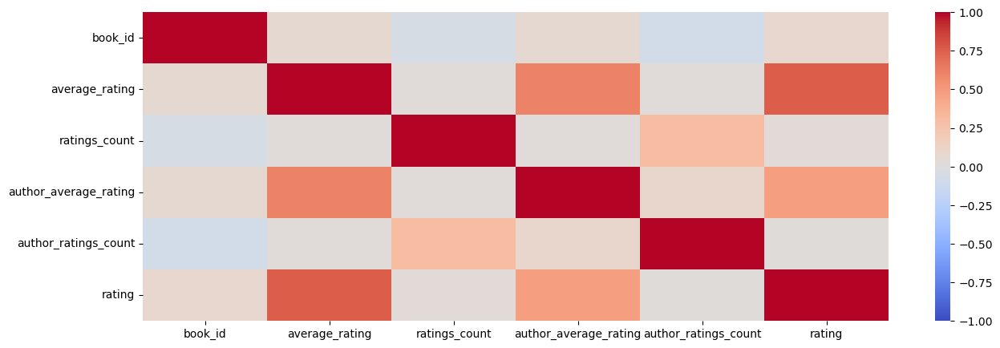

In [47]:
# check the correlations among the numeric features

plt.figure(figsize=(15, 5))
sns.heatmap(df_book.corr(), cmap="coolwarm", vmax=1.0, vmin=-1.0)
plt.show()

From the above heatmap, it indicates that `author_average_rating` has a realtive stronger relationship with `rating`. The other indicators are not strong, such as `ratings_count` and `author_ratings_count`.

So, later on, will add `author_average_rating` as the author additional information to the model.

### Publisher information

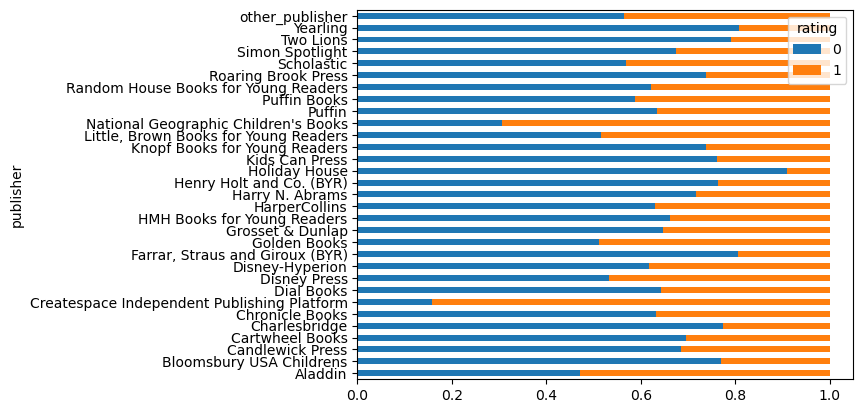

In [77]:
publisher_df = df_book.groupby(['publisher', 'rating'])['publisher'].count()/df_book.groupby('publisher')['publisher'].count()

publisher_df.unstack().plot(kind='barh', stacked=True)
plt.show()

**Note**: publishers such as Createspace, National Geographic Children's have more highly rated books. However, Holiday House has a relatively lower pecentage of highly rated books.

# Model 1: Logistic Regression based only on book description<a class="anchor" id="chapter2"></a>

## Model Prep<a class="anchor" id="section_1_2"></a>

### Train and test split

#### Set variables and split data into test and train set

In [51]:
# store simplified data in X and y
X_word = df_book['lem_word']
y = df_book['rating']

In [52]:
display(X_word)

0        ['sister', 'brother', 'cat', 'dog', 'science',...
1        ['mark', 'shulman', 'tamara', 'petrosino', 're...
2        ['thing', 'learning', 'book', 'colorful', 'ill...
3        ['salad', 'b', 'viking', 'welcome', 'wacky', '...
4        ['chameleon', 'first', 'book', 'katiejane', 's...
                               ...                        
39960    ['exciting', 'full', 'color', 'picture', 'book...
39961    ['difficult', 'enough', 'live', 'neighborhood'...
39962    ['discover', 'dirty', 'secret', 'underground',...
39963    ['hola', 'let', 'learn', 'spanish', 'visit', '...
39964    ['omegaverse', 'manga', 'omega', 'married', 'e...
Name: lem_word, Length: 39964, dtype: object

In [53]:
y

0        1
1        0
2        0
3        1
4        1
        ..
39960    1
39961    1
39962    0
39963    1
39964    1
Name: rating, Length: 39964, dtype: int64

In [55]:
# Splitting our data to reduce the number of observations
X_word_remain, X_word_test, y_remain, y_test = train_test_split(X_word,
                                                    y,
                                                    test_size=0.25,
                                                    random_state=42,
                                                    stratify=y)

# Check 
print(X_word_remain.shape, X_word_test.shape, y_remain.shape, y_test.shape)

(29973,) (9991,) (29973,) (9991,)


In [56]:
# Splitting our data to reduce the number of observations
X_word_train, X_word_val, y_train, y_val = train_test_split(X_word_remain,
                                                                y_remain,
                                                                test_size=0.25,
                                                                random_state=42,
                                                                stratify=y_remain)

# Check 
print(X_word_train.shape, X_word_val.shape, y_train.shape, y_val.shape)

(22479,) (7494,) (22479,) (7494,)


## Model1.1 via TFIDF<a class="anchor" id="section_2_1"></a>

In [57]:
start = time.time()

tfidf = TfidfVectorizer(min_df=20, max_df=0.8)

tfidf.fit(X_word_train)

X_word_train_tfidf = tfidf.transform(X_word_train)
X_word_val_tfidf = tfidf.transform(X_word_val)
X_word_test_tfidf = tfidf.transform(X_word_test)

stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

Runtime: 1.4 seconds


In [58]:
X_word_train_tfidf.shape

(22479, 5796)

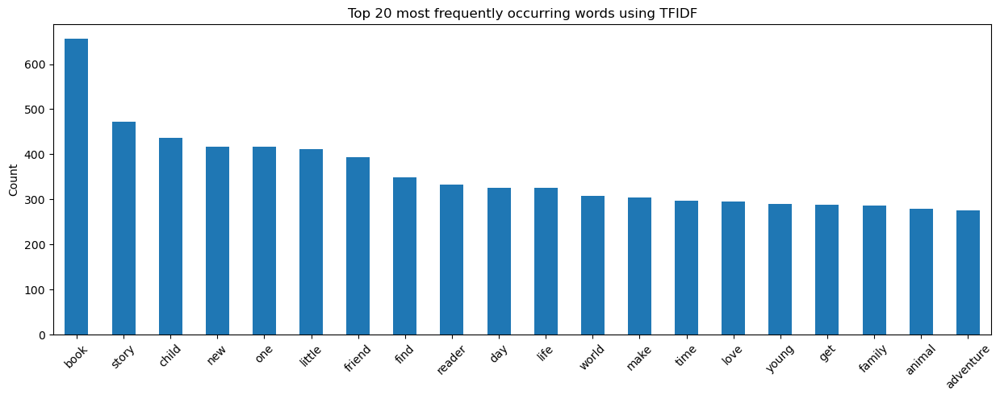

In [61]:
# plot the most common words using TFIDF

word_counts_tfidf = pd.DataFrame(
    {"counts": X_word_train_tfidf.toarray().sum(axis=0)},
    index=tfidf.get_feature_names_out()
).sort_values("counts", ascending=False)

word_counts_tfidf.head(20).plot(kind="bar", figsize=(15, 5), legend=False)
plt.title("Top 20 most frequently occurring words using TFIDF")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

In [73]:
from wordcloud import WordCloud, ImageColorGenerator

In [74]:
mostcommon = list(word_counts_tfidf.head(100).index)
mostcommon = ' '.join(mostcommon)

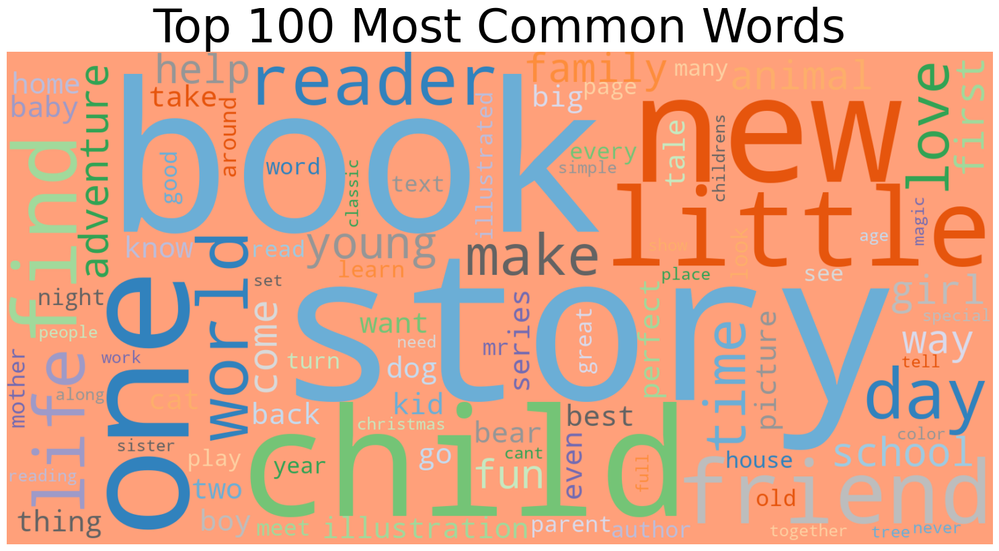

In [75]:
wordcloud = WordCloud(width=1600, height=800, background_color='lightsalmon', colormap='tab20c', collocations=False).generate(str(mostcommon))

fig = plt.figure(figsize=(20,8), facecolor='white')

plt.imshow(wordcloud, interpolation="bilinear")

plt.axis('off')

plt.title('Top 100 Most Common Words', fontsize=50)

plt.tight_layout(pad=0)

plt.show()

# wordcloud resource: https://towardsdatascience.com/simple-wordcloud-in-python-2ae54a9f58e5

---

### Modeling using TFIDF<a class="anchor" id="section_1_2"></a>

In [64]:
start = time.time()

# The C_values to try
C_values = [0.001, 0.01, 0.1, 0.5, 1, 5, 10, 100]

# Empty lists to append train and test accuracy scores to 
train_acc_tfidf = []
val_acc_tfidf = []

# Loop through the different C values
for C in C_values:

    # Instantiate the model, increase max_iter to 10000 
    logit_tfidf = LogisticRegression(C=C, max_iter=10000, random_state=42)

    # Fit the model 
    logit_tfidf.fit(X_word_train_tfidf, y_train)

    # Score the model 
    train_acc_tfidf.append(logit_tfidf.score(X_word_train_tfidf, y_train))
    val_acc_tfidf.append(logit_tfidf.score(X_word_val_tfidf, y_val))

stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

Runtime: 2.49 seconds


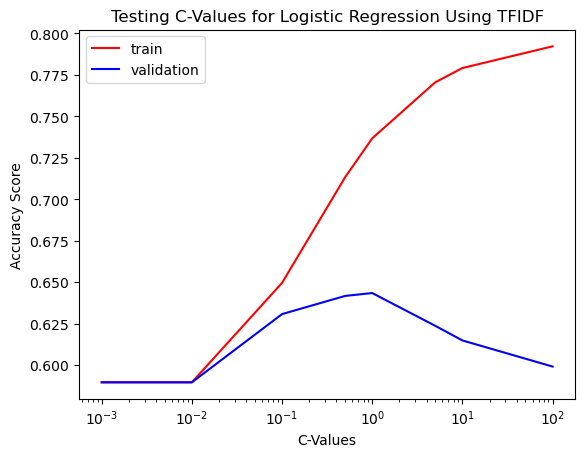

In [65]:
# visualize accuracies for different C-values
plt.figure()
plt.plot(C_values, train_acc_tfidf, c='red', label='train')
plt.plot(C_values, val_acc_tfidf, c='blue', label='validation')
plt.xscale('log')
plt.xlabel('C-Values')
plt.ylabel('Accuracy Score')
plt.title('Testing C-Values for Logistic Regression Using TFIDF')
plt.legend()
plt.show()

Based on the initial modeling, the best C value is close to 0.1.

In [66]:
# Instantiate the model 
logit_tfidf_optimise = LogisticRegression(C=0.1, max_iter=10000, random_state=42)

# Fit the model 
logit_tfidf_optimise.fit(X_word_train_tfidf, y_train)

# Store accuracy scores
train_score_tfidf = logit_tfidf_optimise.score(X_word_train_tfidf, y_train)
test_score_tfidf = logit_tfidf_optimise.score(X_word_test_tfidf, y_test)

# Score the model 
print(f"Train Accuracy TFIDF: {train_score_tfidf}")
print(f"Test Accuracy TFIDF: {test_score_tfidf}")

Train Accuracy TFIDF: 0.6495840562302594
Test Accuracy TFIDF: 0.6226603943549194


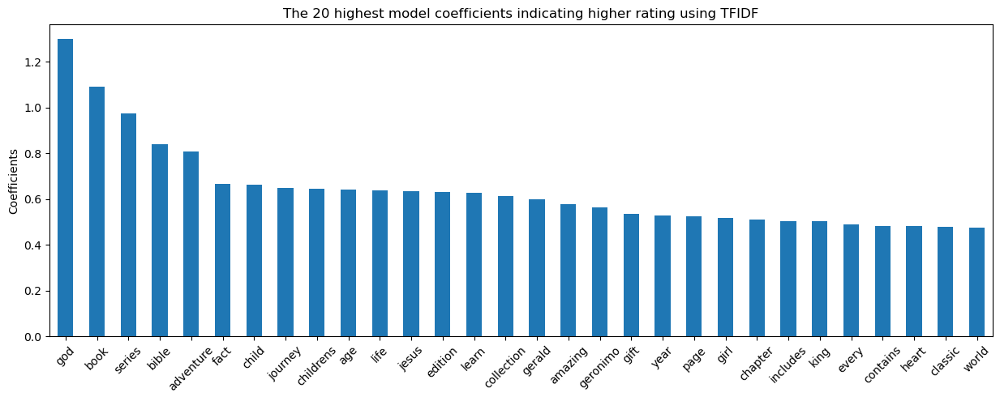

In [67]:
# check the coeffients of the model
word_coef_tfidf = pd.DataFrame(
    {"coefficients": logit_tfidf_optimise.coef_[0]},
    index=tfidf.get_feature_names_out()
).sort_values("coefficients", ascending=False)

word_coef_tfidf.head(30).plot(kind="bar", figsize=(15, 5), legend=False)
plt.title("The 20 highest model coefficients indicating higher rating using TFIDF")
plt.ylabel("Coefficients")
plt.xticks(rotation=45)
plt.show()

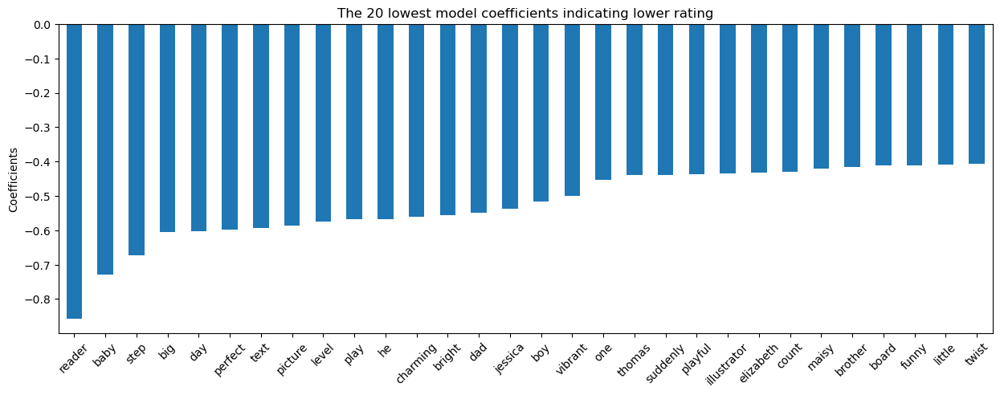

In [68]:
# check the coeffients of the model
word_coef_tfidf_low = pd.DataFrame(
    {"coefficients": logit_tfidf_optimise.coef_[0]},
    index=tfidf.get_feature_names_out()
).sort_values("coefficients", ascending=True)

word_coef_tfidf_low.head(30).plot(kind="bar", figsize=(15, 5), legend=False)
plt.title("The 20 lowest model coefficients indicating lower rating")
plt.ylabel("Coefficients")
plt.xticks(rotation=45)
plt.show()

In [69]:
# Get class predictions
y_pred = logit_tfidf_optimise.predict(X_word_test_tfidf)

# Generate confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred)

# label rows and columns
cf_df = pd.DataFrame(
    cf_matrix, 
    columns=["Predicted High Rating", "Predicted Low Rating"],
    index=["True High Rating", "True Low Rating"]
)

display(cf_df)

,Predicted High Rating,Predicted Low Rating
True High Rating,5558,333
True Low Rating,3437,663


/Users/sl/opt/anaconda3/envs/mycap/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



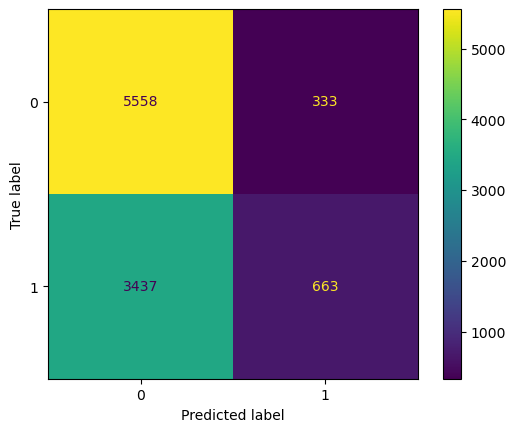

In [70]:
# the function expects the estimator, inputs and target as parameters
plot_confusion_matrix(logit_tfidf_optimise, X_word_test_tfidf, y_test);

In [72]:
report_tfidf_logit = classification_report(y_test, y_pred)
print(report_tfidf_logit)

              precision    recall  f1-score   support

           0       0.62      0.94      0.75      5891
           1       0.67      0.16      0.26      4100

    accuracy                           0.62      9991
   macro avg       0.64      0.55      0.50      9991
weighted avg       0.64      0.62      0.55      9991



**Summary on Logistic Regression on Book Description**

Using TFIDF on word vectorization, test result of F1 score is 62%.

Words with high coefficients such as like 'gerald'-character in "Elephant & Piggie", 'geronimo' - character of a children book series, are quite popluar Children's books with very good reviews.

Words with high coefficients also include 'series', 'edition', 'collection' etc., which shows that books with series are tend to related with high ratings. And in fact, when books with good rating, also normally will continue to publish more series. 

However, the precisoin and recall scores for predicting 1 is much lower, that means model does not do a good job for identifying good books. One possible reason would be the imbalanced data, that the model has more data points (close to 60% of dataset is in class 0). Additionally, only based on book description, it does not have a strong correlation with book's rating, so will further add additional author and publisher information.

---

# Model 2: Logistic Regression adding author and publisher info<a class="anchor" id="chapter3"></a>

### Model Prep

Train and test split

In [76]:
df_book.head()

,book_id,title,lem_word,publisher,average_rating,ratings_count,author_average_rating,author_ratings_count,rating
0,22007198,"""A"" IS FOR THE ALCHEMIST","['sister', 'brother', 'cat', 'dog', 'science',...",other_publisher,4.33,12,4.33,12,1
1,334,"""A"" Is for Zebra","['mark', 'shulman', 'tamara', 'petrosino', 're...",other_publisher,3.68,46,4.01,6540,0
2,25589071,"""A"" Things (A to Z Things #1)","['thing', 'learning', 'book', 'colorful', 'ill...",other_publisher,3.00,4,3.37,1289,0
3,2586488,"""A"" is for Salad","['salad', 'b', 'viking', 'welcome', 'wacky', '...",Puffin Books,4.04,11,3.98,1861,1
4,22600056,"""Am I a Chameleon?""","['chameleon', 'first', 'book', 'katiejane', 's...",other_publisher,4.57,7,4.16,31,1


In [78]:
# store simplified data in X and y
X = df_book[['lem_word', 'publisher', 'author_average_rating']]
y = df_book['rating']

In [79]:
display(X)

,lem_word,publisher,author_average_rating
0,"['sister', 'brother', 'cat', 'dog', 'science',...",other_publisher,4.33
1,"['mark', 'shulman', 'tamara', 'petrosino', 're...",other_publisher,4.01
2,"['thing', 'learning', 'book', 'colorful', 'ill...",other_publisher,3.37
3,"['salad', 'b', 'viking', 'welcome', 'wacky', '...",Puffin Books,3.98
4,"['chameleon', 'first', 'book', 'katiejane', 's...",other_publisher,4.16
...,...,...,...
39960,"['exciting', 'full', 'color', 'picture', 'book...",other_publisher,3.93
39961,"['difficult', 'enough', 'live', 'neighborhood'...",other_publisher,3.75
39962,"['discover', 'dirty', 'secret', 'underground',...",other_publisher,3.84
39963,"['hola', 'let', 'learn', 'spanish', 'visit', '...",other_publisher,4.43


In [80]:
y

0        1
1        0
2        0
3        1
4        1
        ..
39960    1
39961    1
39962    0
39963    1
39964    1
Name: rating, Length: 39964, dtype: int64

In [83]:
# Splitting our data to reduce the number of observations
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.25,
                                                    random_state=42,
                                                    stratify=y)

# Check 
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(29973, 3) (9991, 3) (29973,) (9991,)


In [84]:
X_train

,lem_word,publisher,author_average_rating
7994,"['tough', 'new', 'kid', 'carver', 'elementary'...",other_publisher,3.70
9187,"['bob', 'marley', 'song', 'known', 'world', 'p...",Chronicle Books,4.17
34960,"['nina', 'mother', 'miranda', 'mysteriously', ...",other_publisher,3.60
20335,"['sixth', 'grade', 'worldsusan', 'simmons', 't...",Aladdin,3.95
25745,"['kid', 'often', 'told', 'sit', 'still', 'quie...",other_publisher,3.84
...,...,...,...
16364,"['shadow', 'bregman', 'twelveyearold', 'rescue...",other_publisher,4.76
25959,"['stewie', 'special', 'skink', 'beautiful', 'b...",other_publisher,4.43
26763,"['friend', 'always', 'someone', 'know', 'cheer...",other_publisher,3.98
19904,"['zachariah', 'ohoras', 'distinctive', 'retro'...",Dial Books,3.95


## Model 2.1 Logistic Regression on combined info<a class="anchor" id="section_3_1"></a>

### Build pipeline in processing cross validation for train and validation.

Steps inlcuding below to avoid data leakage:
- OHE: publisher
- TFIDF: lemmatised words based on book description
- Standard Scaler for numeric items

In [85]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_val_score

In [86]:
start = time.time()

cross_validation_scores = []

C_range = np.array([0.01,0.05,0.1,0.5,1,10])


ohe_tfidf_scaler = ColumnTransformer(transformers = [('publisher_transform', OneHotEncoder(sparse=False, drop='first'),
                                                   ['publisher']),
                                                  ('tfidf_transform', 
                                                   TfidfVectorizer(min_df=20, max_df=0.8),
                                                   'lem_word'),
                                             ('MinMax', MinMaxScaler(), ['author_average_rating'])],
                              remainder = "passthrough")

                                               
for c in C_range:
    estimators = [('transformer', ohe_tfidf_scaler),
                  ('logit', LogisticRegression(C=c, solver='lbfgs', random_state=1, max_iter=1000))]
    
    pipe = Pipeline(estimators)
    
    cv_score = np.mean(cross_val_score(pipe, X_train, y_train, cv = 5))

    cross_validation_scores.append(cv_score)

stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

Runtime: 30.37 seconds


In [87]:
cross_validation_scores

[0.6632966243975418,
 0.7321258261319423,
 0.7397328159407669,
 0.7413343618848206,
 0.7375308586317761,
 0.7099391913459192]

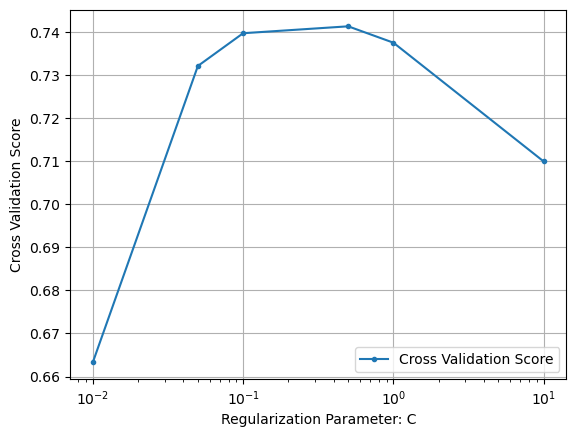

The best model has C =  0.5


In [88]:
# Plot the cross validation chart

plt.figure()
plt.plot(C_range, cross_validation_scores, label="Cross Validation Score", marker='.')
plt.legend()
plt.xscale("log")
plt.xlabel('Regularization Parameter: C')
plt.ylabel('Cross Validation Score')
plt.grid()
plt.show();

which_max = np.array(cross_validation_scores).argmax()
print("The best model has C = ",C_range[which_max])

In [89]:
ohe_tfidf_scaler = ColumnTransformer(transformers = [('publisher_transform', OneHotEncoder(sparse=False, drop='first'),
                                                   ['publisher']),
                                                  ('tfidf_transform', 
                                                   TfidfVectorizer(min_df=20, max_df=0.8),
                                                   'lem_word'),
                                             ('MinMax', MinMaxScaler(), ['author_average_rating'])],
                              remainder = "passthrough")

estimators_logit = [('transformer', ohe_tfidf_scaler),
                  ('logit', LogisticRegression(C=0.5, solver='lbfgs', random_state=1, max_iter=1000))]

pipe_logit = Pipeline(estimators)

In [90]:
start = time.time()

pipe_logit.fit(X_train, y_train)
print(f'Optimised Logistic Regression Train Score: {pipe_logit.score(X_train, y_train)}')
print(f'Optimised Logistic Regression Test Score: {pipe_logit.score(X_test, y_test)}')

stop = time.time()
runtime_logit = stop-start
print(f"Runtime: {round(runtime_logit,2)} seconds")

Optimised Logistic Regression Train Score: 0.8322156607613519
Optimised Logistic Regression Test Score: 0.7121409268341508
Runtime: 2.98 seconds


/Users/sl/opt/anaconda3/envs/mycap/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



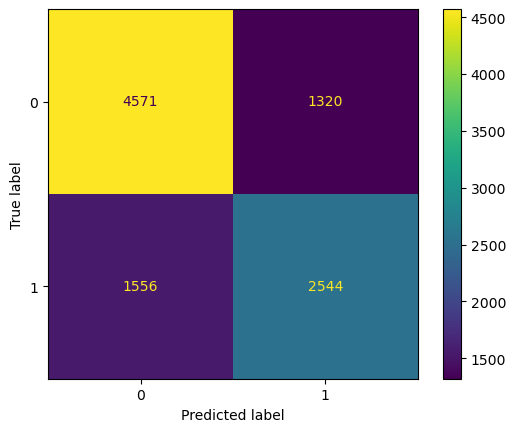

In [91]:
plot_confusion_matrix(pipe_logit, X_test, y_test);

In [93]:
y_logit_pred = pipe_logit.predict(X_test)

report_logit = classification_report(y_test, y_logit_pred)
print(report_logit)

              precision    recall  f1-score   support

           0       0.75      0.78      0.76      5891
           1       0.66      0.62      0.64      4100

    accuracy                           0.71      9991
   macro avg       0.70      0.70      0.70      9991
weighted avg       0.71      0.71      0.71      9991



**Summary on Logistic Regression Model 2**

Overall accuracy score increased from 62% to 71% by adding more information about book author and book publisher, additionally, by filtering out more detialed C value, find the optimised value of 0.5 through cross validation. So, adding more relevant features significantly improve the predicting, thus how to select features (especially meaningful features) is critial to the model.

The prediction average score has improved quite a lot compared with Model 1.

- f1 for class '0' increased from 75% to 76%.
- f1 for class '1' increased from 26% to 64%.

However, since the train set score is 83%, so there's still overfitting(compared with test of 71%) as well as underfitting(train score of 83% still not high enough.)

So, will further conduct bagging method.

---

## Model 2.2 Bagging on Logistic Regression<a class="anchor" id="section_3_2"></a>

Since data is a bit overfitting and for class '0' has much bigger variance than '1'. So will run a bagging model on logistic regression.

- set the penalty of 'l1' regulization
- further reduce the number of tokens by increasing min_df, as it takes too much computation to run the ensembled mdoel. 

In [94]:
from sklearn.ensemble import BaggingClassifier

In [95]:
X_train

,lem_word,publisher,author_average_rating
7994,"['tough', 'new', 'kid', 'carver', 'elementary'...",other_publisher,3.70
9187,"['bob', 'marley', 'song', 'known', 'world', 'p...",Chronicle Books,4.17
34960,"['nina', 'mother', 'miranda', 'mysteriously', ...",other_publisher,3.60
20335,"['sixth', 'grade', 'worldsusan', 'simmons', 't...",Aladdin,3.95
25745,"['kid', 'often', 'told', 'sit', 'still', 'quie...",other_publisher,3.84
...,...,...,...
16364,"['shadow', 'bregman', 'twelveyearold', 'rescue...",other_publisher,4.76
25959,"['stewie', 'special', 'skink', 'beautiful', 'b...",other_publisher,4.43
26763,"['friend', 'always', 'someone', 'know', 'cheer...",other_publisher,3.98
19904,"['zachariah', 'ohoras', 'distinctive', 'retro'...",Dial Books,3.95


In [96]:
y_train

7994     0
9187     1
34960    0
20335    0
25745    0
        ..
16364    1
25959    1
26763    1
19904    0
20073    0
Name: rating, Length: 29973, dtype: int64

In [97]:
start = time.time()

ohe_tfidf_scaler = ColumnTransformer(transformers = [('publisher_transform', OneHotEncoder(sparse=False, drop='first'),
                                                   ['publisher']),
                                                  ('tfidf_transform', 
                                                   TfidfVectorizer(min_df=20, max_df=0.8),
                                                   'lem_word'),
                                             ('MinMax', MinMaxScaler(), ['author_average_rating'])],
                              remainder = "passthrough")


estimators = [('transformer', ohe_tfidf_scaler),
              ('ensemble_logit', BaggingClassifier(LogisticRegression(C=0.5, solver='saga', penalty='l1', random_state=1, max_iter=1000),
                                                   max_features = 0.7,
                                                   max_samples = 0.7,
                                                  n_estimators=10,
                                                  random_state=1,
                                                  verbose=1))]
    
pipe_bagging = Pipeline(estimators)

pipe_bagging.fit(X_train, y_train)


stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Runtime: 58.15 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   57.3s finished


In [170]:
pipe_bagging.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


0.7449371100657258

In [98]:
pipe_bagging.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


0.7364628165348814

/Users/sl/opt/anaconda3/envs/mycap/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


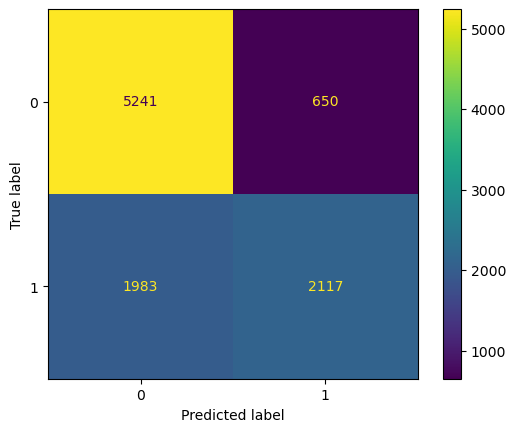

In [99]:
plot_confusion_matrix(pipe_bagging, X_test, y_test);

In [154]:
y_bagging_pred = pipe_bagging.predict(X_test)

report_bagging = classification_report(y_test, y_bagging_pred)
print(report_bagging)

              precision    recall  f1-score   support

           0       0.73      0.89      0.80      5891
           1       0.77      0.52      0.62      4100

    accuracy                           0.74      9991
   macro avg       0.75      0.70      0.71      9991
weighted avg       0.74      0.74      0.72      9991



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


**Summary**

Applied bagging on Logistic Regression and performance is improved to 74%.

- enhance the learning/analysing on high variance features
- amplify the commonalites by reducing the impact of outliers
- the prediction on class '1' is lower, could be the imbalanced dataset, which class 1 accounts for 40%

---

## Model 3 Random Forest<a class="anchor" id="chapter4"></a>

Apply decision tree models to allow non-linear modeling

In [102]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

## Model 3.1 Random Forest<a class="anchor" id="section_4_1"></a>

In [104]:
start = time.time()

ohe_tfidf = ColumnTransformer(transformers = [('publisher_transform', OneHotEncoder(sparse=False, drop='first'),
                                                   ['publisher']),
                                                  ('tfidf_transform', 
                                                   TfidfVectorizer(min_df=20, max_df=0.8),
                                                   'lem_word')],
                              remainder = "passthrough")


estimators_rf = [('transformer', ohe_tfidf),
                  ('model', RandomForestClassifier())]

pipe_rf = Pipeline(estimators_rf)

param_grid_rf = [
            {'model': [RandomForestClassifier()],
             'transformer': [ohe_tfidf], 
             'model__max_depth': [50, 100, 150],
            'model__n_estimators': [10, 20, 30],
            'model__min_samples_leaf': [100],
            'model__random_state': [42]}
]

grid_rf = GridSearchCV(pipe_rf, param_grid_rf, cv=5)
fittedgrid_rf = grid_rf.fit(X_train, y_train)

stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

Runtime: 43.36 seconds


In [105]:
fittedgrid_rf.best_estimator_

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('publisher_transform',
                                                  OneHotEncoder(drop='first',
                                                                sparse=False),
                                                  ['publisher']),
                                                 ('tfidf_transform',
                                                  TfidfVectorizer(max_df=0.8,
                                                                  min_df=20),
                                                  'lem_word')])),
                ('model',
                 RandomForestClassifier(max_depth=50, min_samples_leaf=100,
                                        n_estimators=10, random_state=42))])

In [107]:
fittedgrid_rf.score(X_train, y_train)

0.643112134254162

In [106]:
fittedgrid_rf.score(X_test, y_test)

0.632569312381143

/Users/sl/opt/anaconda3/envs/mycap/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



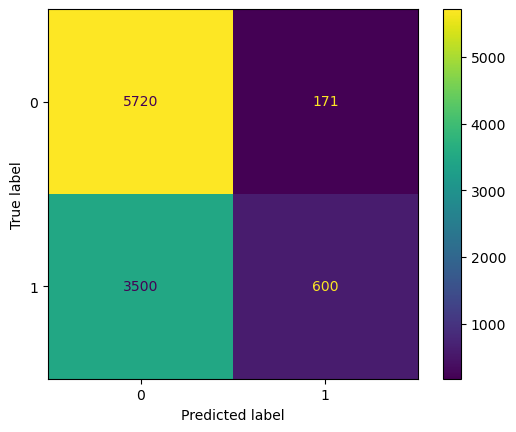

In [108]:
plot_confusion_matrix(fittedgrid_rf, X_test, y_test);

In [109]:
y_rf_pred = fittedgrid_rf.predict(X_test)

report_rf = classification_report(y_test, y_rf_pred)
print(report_rf)

              precision    recall  f1-score   support

           0       0.62      0.97      0.76      5891
           1       0.78      0.15      0.25      4100

    accuracy                           0.63      9991
   macro avg       0.70      0.56      0.50      9991
weighted avg       0.69      0.63      0.55      9991



**Summary**

Random Forest does not perform well, main reasons would be model does not learn the datapoints quite well

- increase max_features for RF, as its default setting is the sqrt of n_features, in this case would be quite low

### Increse max_features, to let RF model evaluate more features a time

In [123]:
start = time.time()

ohe_tfidf = ColumnTransformer(transformers = [('publisher_transform', OneHotEncoder(sparse=False, drop='first'),
                                                   ['publisher']),
                                                  ('tfidf_transform', 
                                                   TfidfVectorizer(min_df=20, max_df=0.8),
                                                   'lem_word')],
                              remainder = "passthrough")



estimators_rf = [('transformer', ohe_tfidf),
                  ('model', RandomForestClassifier())]

pipe_rf = Pipeline(estimators_rf)

param_grid_rf = [
            {'model': [RandomForestClassifier()],
             'transformer': [ohe_tfidf], 
             'model__max_depth': [30, 50, 100, 200],
             'model__max_features': [0.5, 0.6, 0.7],
            'model__n_estimators': [10, 20, 30],
            'model__min_samples_leaf': [50, 100],
            'model__random_state': [42]}
]

grid_rf2 = GridSearchCV(pipe_rf, param_grid_rf, cv=5)
fittedgrid_rf2 = grid_rf2.fit(X_train, y_train)

stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

Runtime: 3281.09 seconds


In [124]:
fittedgrid_rf2.score(X_train, y_train)

0.7570480098755547

In [125]:
fittedgrid_rf2.score(X_test, y_test)

0.7327594835351816

In [126]:
fittedgrid_rf2.best_estimator_

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('publisher_transform',
                                                  OneHotEncoder(drop='first',
                                                                sparse=False),
                                                  ['publisher']),
                                                 ('tfidf_transform',
                                                  TfidfVectorizer(max_df=0.8,
                                                                  min_df=20),
                                                  'lem_word')])),
                ('model',
                 RandomForestClassifier(max_depth=30, max_features=0.5,
                                        min_samples_leaf=50, n_estimators=30,
                                        random_state=42))])

/Users/sl/opt/anaconda3/envs/mycap/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



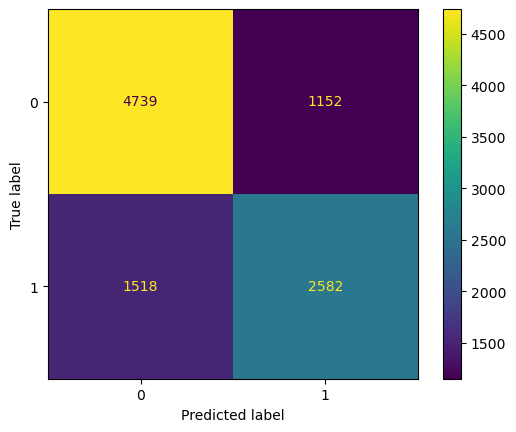

In [127]:
plot_confusion_matrix(fittedgrid_rf2, X_test, y_test);

In [148]:
y_rf_pred2 = fittedgrid_rf2.predict(X_test)

report_rf = classification_report(y_test, y_rf_pred2)
print(report_rf)

              precision    recall  f1-score   support

           0       0.76      0.80      0.78      5891
           1       0.69      0.63      0.66      4100

    accuracy                           0.73      9991
   macro avg       0.72      0.72      0.72      9991
weighted avg       0.73      0.73      0.73      9991



**Summary**

After increasing the number of features that each tree selected, the model's performance improved quite a lot.

Still model predicted better result for class 0, however, low recall for class '1', that means many good books predicted as medium books. 

Also, train score: 74% and test score 73%, so overall model is still underfitting. Next to apply XGBoost on Random Forest to boosting the learning on weak features.

## Model 3.2 XGBoost on Random Forest<a class="anchor" id="section_4_2"></a>

In [116]:
from xgboost import XGBClassifier

In [117]:
start = time.time()

ohe_tfidf = ColumnTransformer(transformers = [('publisher_transform', OneHotEncoder(sparse=False, drop='first'),
                                                   ['publisher']),
                                                  ('tfidf_transform', 
                                                   TfidfVectorizer(min_df=20, max_df=0.8),
                                                   'lem_word')],
                              remainder = "passthrough")


estimators_xgb = [('transformer', ohe_tfidf),
                  ('model', XGBClassifier())]

pipe_xgb = Pipeline(estimators_xgb)

param_grid_xgb = [
            {'model': [XGBClassifier(n_jobs=-1)],
             'transformer': [ohe_tfidf], 
             'model__max_depth': [30, 50, 80],
             'model__colsample_bytree': [0.5, 0.6, 0.7],
            'model__n_estimators': [10],
             'model__num_parallel_tree': [10, 20],
            'model__random_state': [42],
            'model__verbosity': [1]}
]

grid_xgb = GridSearchCV(pipe_xgb, param_grid_xgb, cv=5)
fittedgrid_xgb = grid_xgb.fit(X_train, y_train)

stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

Runtime: 3290.45 seconds


In [118]:
fittedgrid_xgb.score(X_train, y_train)

0.9235311780602542

In [119]:
fittedgrid_xgb.score(X_test, y_test)

0.7414673205885297

In [120]:
fittedgrid_xgb.best_estimator_

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('publisher_transform',
                                                  OneHotEncoder(drop='first',
                                                                sparse=False),
                                                  ['publisher']),
                                                 ('tfidf_transform',
                                                  TfidfVectorizer(max_df=0.8,
                                                                  min_df=20),
                                                  'lem_word')])),
                ('model',
                 XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
                               colsample_bylevel=1, colsample_bynode=1,
                               col...
                               feature_types=None, gamma=0, gpu_id=-1,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints='',
                               learning_rate=0.300000012, max_bin=256,
                               max_cat_threshold=64, max_cat_to_onehot=4,
                               max_delta_step=0, max_depth=30, max_leaves=0,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=10,
                               n_jobs=-1, num_parallel_tree=20,
                               predictor='auto', random_state=42, ...))])

/Users/sl/opt/anaconda3/envs/mycap/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



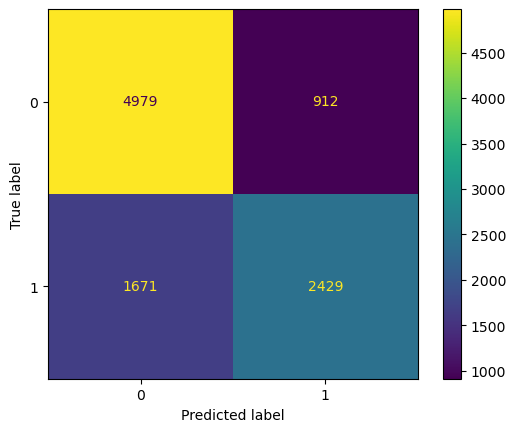

In [121]:
plot_confusion_matrix(fittedgrid_xgb, X_test, y_test);

In [122]:
y_xgb_pred = fittedgrid_xgb.predict(X_test)

report_xgb = classification_report(y_test, y_xgb_pred)
print(report_xgb)

              precision    recall  f1-score   support

           0       0.75      0.85      0.79      5891
           1       0.73      0.59      0.65      4100

    accuracy                           0.74      9991
   macro avg       0.74      0.72      0.72      9991
weighted avg       0.74      0.74      0.74      9991



### Adjusting the overfitting of XGBoost

In [129]:
start = time.time()

ohe_tfidf = ColumnTransformer(transformers = [('publisher_transform', OneHotEncoder(sparse=False, drop='first'),
                                                   ['publisher']),
                                                  ('tfidf_transform', 
                                                   TfidfVectorizer(min_df=50, max_df=0.8),
                                                   'lem_word')],
                              remainder = "passthrough")


estimators_xgb = [('transformer', ohe_tfidf),
                  ('model', XGBClassifier())]

pipe_xgb = Pipeline(estimators_xgb)

param_grid_xgb = [
            {'model': [XGBClassifier(n_jobs=-1)],
             'transformer': [ohe_tfidf], 
             'model__max_depth': [30, 100, 300],
             'model__colsample_bytree': [0.5, 0.8],
            'model__n_estimators': [5],
             'model__num_parallel_tree': [20, 50],
            'model__random_state': [42],
            'model__verbosity': [1]}
]

grid_xgb2 = GridSearchCV(pipe_xgb, param_grid_xgb, cv=5)
fittedgrid_xgb2 = grid_xgb2.fit(X_train, y_train)

stop = time.time()
runtime = stop-start
print(f"Runtime: {round(runtime,2)} seconds")

Runtime: 6750.3 seconds


In [130]:
fittedgrid_xgb2.best_estimator_

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('publisher_transform',
                                                  OneHotEncoder(drop='first',
                                                                sparse=False),
                                                  ['publisher']),
                                                 ('tfidf_transform',
                                                  TfidfVectorizer(max_df=0.8,
                                                                  min_df=50),
                                                  'lem_word')])),
                ('model',
                 XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
                               colsample_bylevel=1, colsample_bynode=1,
                               col...
                               feature_types=None, gamma=0, gpu_id=-1,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints='',
                               learning_rate=0.300000012, max_bin=256,
                               max_cat_threshold=64, max_cat_to_onehot=4,
                               max_delta_step=0, max_depth=30, max_leaves=0,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=5,
                               n_jobs=-1, num_parallel_tree=50,
                               predictor='auto', random_state=42, ...))])

In [144]:
fittedgrid_xgb2.score(X_train, y_train)

0.8965735828912688

In [145]:
fittedgrid_xgb2.score(X_test, y_test)

0.7432689420478431

In [146]:
y_xgb_pred = fittedgrid_xgb2.predict(X_test)

report_xgb = classification_report(y_test, y_xgb_pred)
print(report_xgb)

              precision    recall  f1-score   support

           0       0.75      0.85      0.80      5891
           1       0.73      0.59      0.65      4100

    accuracy                           0.74      9991
   macro avg       0.74      0.72      0.72      9991
weighted avg       0.74      0.74      0.74      9991



**Summary**

After applying XGBoost, model's train score increased to 90%, however test score is only 74%. There is significant overfitting. Potential ways to further improve:

- further hyparameter tuning on XGBoosting to reduce overfitting, such as increase the number of paralell trees (random forest trees) to average out more on outliers.


In [156]:
from sklearn.metrics import roc_curve, roc_auc_score

In [167]:
# generate scores for bagging model
y_proba_bagging = pipe_bagging.predict_proba(X_test)[:,1]
fprs_bagging, tprs_bagging, thresholds_bagging = roc_curve(y_test, y_proba_bagging)
roc_auc_bagging = roc_auc_score(y_test, y_proba_bagging)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [163]:
# generate scores for random forest
y_proba_rf2 = fittedgrid_rf2.predict_proba(X_test)[:,1]
fprs_rf2, tprs_rf2, thresholds_rf2 = roc_curve(y_test, y_proba_rf2)
roc_auc_rf2 = roc_auc_score(y_test, y_proba_rf2)

In [164]:
# generate scores for XGBoosting
y_proba_xgb2 = fittedgrid_xgb2.predict_proba(X_test)[:,1]
fprs_xgb2, tprs_xgb2, thresholds_xgb2 = roc_curve(y_test, y_proba_xgb2)
roc_auc_xgb2 = roc_auc_score(y_test, y_proba_xgb2)

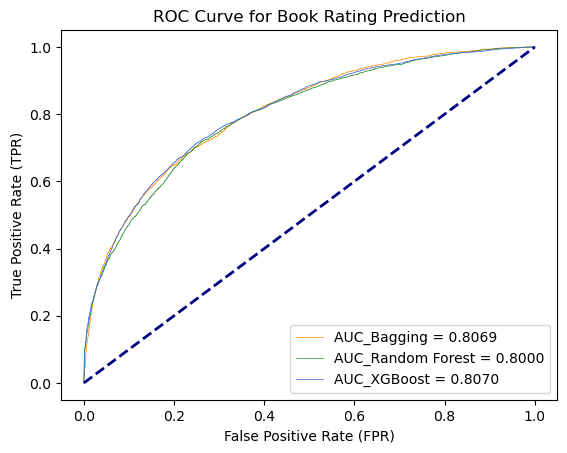

In [169]:
plt.figure()
plt.plot(fprs_bagging, tprs_bagging, color='darkorange',
         lw=0.5, label='AUC_Bagging = %0.4f' % roc_auc_bagging)
plt.plot(fprs_rf2, tprs_rf2, color='forestgreen',
         lw=0.5, label='AUC_Random Forest = %0.4f' % roc_auc_rf2)
plt.plot(fprs_xgb2, tprs_xgb2, color='royalblue',
         lw=0.5, label='AUC_XGBoost = %0.4f' % roc_auc_xgb2)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for Book Rating Prediction')
plt.legend(loc="best")
plt.show()

**Modeling Summary**

Applied different classifiers on the book dataset to predict book rating,

- Base model Logistic Regression f1 score: 0.71
- Applied ensemble methods, including bagging on Logistic Regression, Random Forest, and XGBoost, model performance improved to around 0.74.
- Overall, prediction result for class 1 is much lower, one potential reason is the imbalanced dataset, where class 1 (high reviews) accounts for 41% of total dataset, and with smaller variance compared to class 0.
- Bagging and Random Forest are underfitting while XGB is singificantly overfitted, further processes such as feature engineering and parameters tuning as the next steps to improve the model.




---